In [180]:
import numpy as np
import matplotlib.pyplot as plt

from scipy.spatial.transform import Rotation as R
#https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.transform.Rotation.html#scipy.spatial.transform.Rotation

# my library of functions for this project l
# octa_lib contains vertices,faces of an octahedron 
from octa_lib import * 

%load_ext autoreload
%autoreload 1
%aimport octa_lib

# for reading images 
from pims import pipeline
from pims import Frame
import pims

from scipy.signal import savgol_filter

from skimage.draw import polygon
from skimage import feature
from skimage.feature import match_template

from skimage.filters import gaussian

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


nframes= 524 , frame shape = (512, 1280, 3)


Frame([[[45, 36, 47],
        [45, 36, 47],
        [48, 40, 46],
        ...,
        [33, 25, 31],
        [30, 24, 29],
        [28, 22, 27]],

       [[45, 36, 47],
        [44, 35, 46],
        [47, 39, 45],
        ...,
        [31, 23, 29],
        [33, 27, 32],
        [32, 26, 31]],

       [[47, 35, 49],
        [49, 37, 51],
        [47, 35, 47],
        ...,
        [32, 25, 37],
        [29, 21, 29],
        [30, 22, 30]],

       ...,

       [[49, 30, 46],
        [45, 26, 42],
        [48, 27, 44],
        ...,
        [25, 19, 26],
        [29, 19, 20],
        [32, 22, 23]],

       [[33, 21, 33],
        [33, 21, 33],
        [32, 25, 35],
        ...,
        [27, 20, 30],
        [26, 18, 24],
        [24, 16, 22]],

       [[32, 20, 32],
        [32, 20, 32],
        [30, 23, 33],
        ...,
        [23, 16, 26],
        [24, 16, 22],
        [27, 19, 25]]], dtype=uint8)
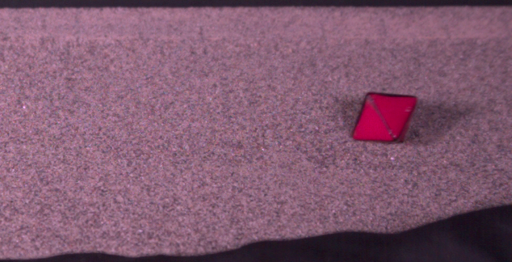

In [199]:
# read in video images 
frames_dir = 'Aug_2_2022/o10_*.png'
framesrgb = pims.open(frames_dir) 
print('nframes=',len(framesrgb),', frame shape =',framesrgb[10].shape)

# frames made this way from oct10.mp4 hight speed video
#/usr/local/bin/ffmpeg -i oct10.mp4  -ss 00:00:0.000 -vframes 1000 o10_%04d.png -hide_banner

fps =3000.0  #video fps ( is correct for oct10 video)
d8_length = 23.3 #  mm with calipers measured red to red pts and green to green opposite points
theta_cam_deg = 45. # camera angle
theta_cam = theta_cam_deg*np.pi/180.0

oroot = 'o10_' # for output files

framesrgb[40][0:400,500:1280]  # show what is in this video


In [193]:
d8_length_model = 2.0
model_vertices = octa_vertices
model_faces = octa_faces

In [62]:
# a color combo red+blue
# this routine also reduces dimension and size of frames
# i0,i1,j0,j1 gives region of image frame we want
# converts arrays to floats
# returned is a framelist of single frames (not rgb)
# a,b,c are weights for each color r,g,b 
# a,b,c could be negative
@pipeline
def color_rgb(frame,i0,i1,j0,j1,a,b,c):
    red  = np.array(frame[i0:i1,j0:j1,0])
    redf = red.astype('float')
    green  = np.array(frame[i0:i1,j0:j1,1])
    greenf = green.astype('float')
    blue  = np.array(frame[i0:i1,j0:j1,2])
    bluef = blue.astype('float')
    y = a*redf +  b*greenf + c*bluef  # weighted by color 
    i = frame.frame_no
    z= Frame(y)
    z.frame_no = i
    # restore frame number information which is needed by trackpy
    return z


Frame([[ 9.,  9.,  9., ...,  6.,  7.,  7.],
       [ 9.,  9.,  9., ...,  6.,  7.,  7.],
       [ 9.,  9.,  9., ..., 12., 11., 11.],
       ...,
       [20., 20., 24., ..., 12., 21., 21.],
       [12., 12.,  9., ..., 12., 13., 13.],
       [12., 12.,  9., ..., 12., 13., 13.]])
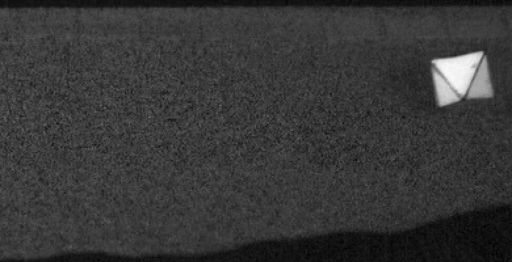

In [136]:
# bring out dice against background by subtracting green from red 
frames_1c=color_rgb(framesrgb,0,512,0,1280,1,-1,0)  # runs on pipeline
# subtract green from red
frames_1c[20][0:400,500:1280]  # series of 1 color frames!

Frame([[[ 48,  39,  50],
        [ 47,  38,  49],
        [ 47,  35,  47],
        ...,
        [ 60,  47,  55],
        [ 60,  46,  61],
        [ 58,  44,  59]],

       [[ 47,  38,  49],
        [ 47,  38,  49],
        [ 45,  33,  45],
        ...,
        [ 51,  38,  46],
        [ 51,  37,  52],
        [ 52,  38,  53]],

       [[ 44,  37,  47],
        [ 43,  36,  46],
        [ 47,  35,  49],
        ...,
        [ 50,  35,  45],
        [ 47,  35,  49],
        [ 47,  35,  49]],

       ...,

       [[153, 105, 133],
        [153, 105, 133],
        [160, 117, 141],
        ...,
        [ 38,  26,  40],
        [ 37,  25,  37],
        [ 36,  24,  36]],

       [[152,  99, 125],
        [156, 103, 129],
        [166, 118, 142],
        ...,
        [ 36,  24,  36],
        [ 36,  24,  40],
        [ 36,  24,  40]],

       [[161, 108, 134],
        [163, 110, 136],
        [165, 117, 141],
        ...,
        [ 35,  23,  35],
        [ 35,  23,  39],
        [ 33,  21,  37]]], dtype=uint8)
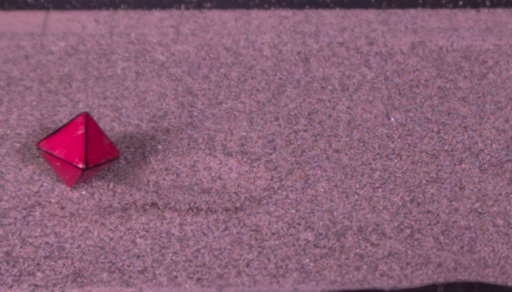

In [192]:
framesrgb[20+420][0:400,0:700]  # show what is in this video
# end at 420  200 frames if doing every other and starting from 20

approximate center i0 = 141 j0=1133
scale factor = 57.2 pixels
median =  32.0


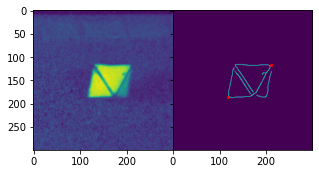

In [109]:
# adjust canny edge detection and find scale factor for dice size 
f0=30;   # which frame
dw=150   # size of subimages (halfsize)
canny_sigma = 2.3  # parameters for canny, low should be below median 
canny_low = 20; canny_high =50
#https://scikit-image.org/docs/stable/api/skimage.feature.html?highlight=canny#skimage.feature.canny
r0,c0,edges,subim,axarr = get_canny_edges(frames_1c,f0,dw,canny_sigma,canny_low,canny_high)

x0=118; x1=210  # adjust so we can estimate the size of the dice
y0=185; y1=117
axarr[1].plot([x0,x1],[y0,y1],'ro',ms=2)
len_long = np.sqrt((x0-x1)**2 + (y0-y1)**2)
#print(len_long)  # this is the length of the whole thing
# take half of this to scale our octagon
scale_fac = len_long/d8_length_model
print('scale factor = {:.1f} pixels'.format(scale_fac))
print('median = ',np.median(subim)) # set the low threshold near but below the median

number of rotations = 31
number of rotations = 620


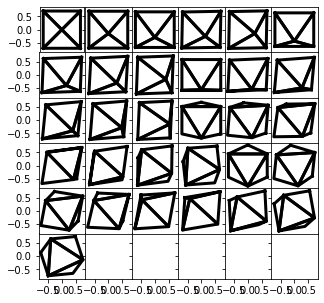

In [115]:
# generate templates
rot_list_base= rot_group_octa_nearby(6) # generate nearby rotations 
# nt=6 here gives 31, if you want more templates, increase this number
disp_rot_list(rot_list_base,model_vertices,model_faces)
extend_rot_list = rot_group_extend(rot_list_base,20) # extend the list of rotations 

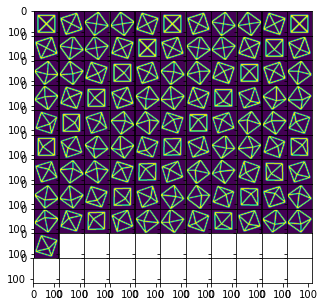

In [114]:
tem_scale_fac = 58 # set to be a bit larger than scale_fac 
# generate the large array of templates
template_arr=big_bin_rot_list3(extend_rot_list,model_vertices,model_faces,tem_scale_fac,3)  
# templates for long rotation list
# here 3 is half width of lines in pixels 
disp_img_arr(template_arr[0:100])  # show some of the templates for the longer list 

In [194]:
pixscale = (d8_length/d8_length_model)  / tem_scale_fac  # mm/pixel 
print('pixscale = {:.3f} mm/pixel'.format(pixscale))


pixscale = 0.201 mm/pixel


approximate center i0 = 141 j0=1133


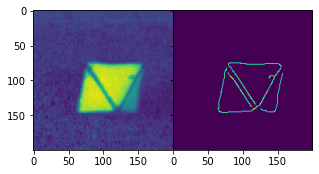

In [120]:
# adjust canny edge detection and chose start image 
f0=30;   # which frame
dw=100   # size of subimages (halfsize)
canny_sigma = 2.3  # parameters for canny, low should be below median 
canny_low = 20; canny_high =50
#https://scikit-image.org/docs/stable/api/skimage.feature.html?highlight=canny#skimage.feature.canny
r0,c0,edges,subim,axarr = get_canny_edges(frames_1c,f0,dw,canny_sigma,canny_low,canny_high)


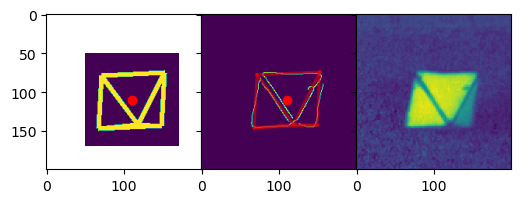

In [121]:
# find the nearest rotation in the large list of possible rotations 
best_rot,k,r,c,template= find_best_match(edges,template_arr,extend_rot_list)
# this takes a few minutes to run as it has to try hundreds of templates 
disp_best_match(subim,edges,r,c,template,best_rot,tem_scale_fac,model_vertices,model_faces)
# display result

In [178]:
# find rotations for a sequence of frames
start_rot = best_rot  # rotation estimate for first frame
rstart = r+r0  # center of mass rows,cols in pixels
cstart = c+c0
tem_scale_fac=58  # scaling factor for model 
dw=100   # size of subimages 
canny_sigma = 2.3  # parameters for canny, low should be below median 
canny_low = 20; canny_high =50
f0=20  # first image frame
df = 2  #spacing 
nf = 190  # number of images to track 
angle = 0.22;  # width of fine rotation grid
nl=5  # number of rotations in new rotation grid  (5^3 = 125 rotations)

doing frame 20
number of rotations = 125
get_edges_rc: 51 251 1043 1243
doing frame 22
number of rotations = 125
get_edges_rc: 17 217 1102 1302
doing frame 24
number of rotations = 125
get_edges_rc: 23 223 1091 1291
doing frame 26
number of rotations = 125
get_edges_rc: 30 230 1079 1279
doing frame 28
number of rotations = 125
get_edges_rc: 37 237 1068 1268
doing frame 30
number of rotations = 125
get_edges_rc: 42 242 1056 1256
doing frame 32
number of rotations = 125
get_edges_rc: 49 249 1044 1244
doing frame 34
number of rotations = 125
get_edges_rc: 56 256 1033 1233
doing frame 36
number of rotations = 125
get_edges_rc: 62 262 1021 1221
doing frame 38
number of rotations = 125
get_edges_rc: 68 268 1007 1207
doing frame 40
number of rotations = 125
get_edges_rc: 74 274 997 1197
doing frame 42
number of rotations = 125
get_edges_rc: 78 278 986 1186
doing frame 44
number of rotations = 125
get_edges_rc: 81 281 977 1177
doing frame 46
number of rotations = 125
get_edges_rc: 80 280 968 1

/Users/aquillen/Desktop/summer_21/pylab/dice_track_b/octa_lib.py:604: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,axarr = plt.subplots(1,3,sharex=True,sharey=True,dpi=100)


doing frame 62
number of rotations = 125
get_edges_rc: 87 287 911 1111
doing frame 64
number of rotations = 125
get_edges_rc: 88 288 906 1106
doing frame 66
number of rotations = 125
get_edges_rc: 88 288 899 1099
doing frame 68
number of rotations = 125
get_edges_rc: 87 287 893 1093
doing frame 70
number of rotations = 125
get_edges_rc: 86 286 887 1087
doing frame 72
number of rotations = 125
get_edges_rc: 84 284 881 1081
doing frame 74
number of rotations = 125
get_edges_rc: 86 286 877 1077
doing frame 76
number of rotations = 125
get_edges_rc: 85 285 872 1072
doing frame 78
number of rotations = 125
get_edges_rc: 82 282 866 1066
doing frame 80
number of rotations = 125
get_edges_rc: 83 283 860 1060
doing frame 82
number of rotations = 125
get_edges_rc: 80 280 855 1055
doing frame 84
number of rotations = 125
get_edges_rc: 80 280 851 1051
doing frame 86
number of rotations = 125
get_edges_rc: 79 279 844 1044
doing frame 88
number of rotations = 125
get_edges_rc: 78 278 838 1038
doing 

get_edges_rc: 91 291 324 524
doing frame 294
number of rotations = 125
get_edges_rc: 93 293 319 519
doing frame 296
number of rotations = 125
get_edges_rc: 93 293 314 514
doing frame 298
number of rotations = 125
get_edges_rc: 95 295 308 508
doing frame 300
number of rotations = 125
get_edges_rc: 96 296 304 504
doing frame 302
number of rotations = 125
get_edges_rc: 97 297 299 499
doing frame 304
number of rotations = 125
get_edges_rc: 98 298 293 493
doing frame 306
number of rotations = 125
get_edges_rc: 99 299 288 488
doing frame 308
number of rotations = 125
get_edges_rc: 101 301 283 483
doing frame 310
number of rotations = 125
get_edges_rc: 101 301 278 478
doing frame 312
number of rotations = 125
get_edges_rc: 102 302 273 473
doing frame 314
number of rotations = 125
get_edges_rc: 105 305 268 468
doing frame 316
number of rotations = 125
get_edges_rc: 106 306 262 462
doing frame 318
number of rotations = 125
get_edges_rc: 107 307 259 459
doing frame 320
number of rotations = 125


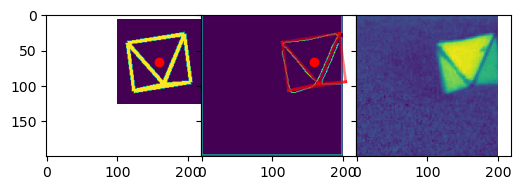

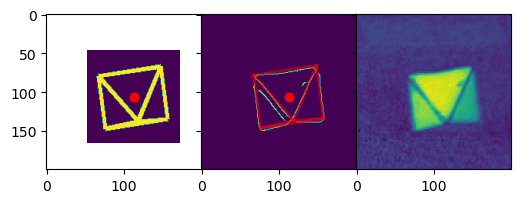

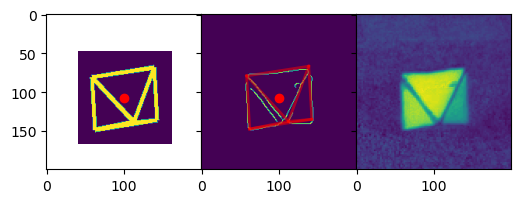

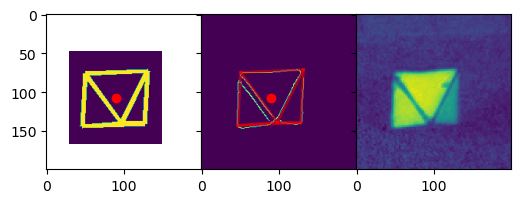

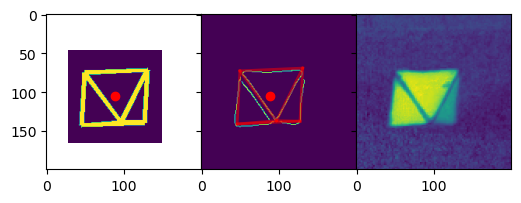

...

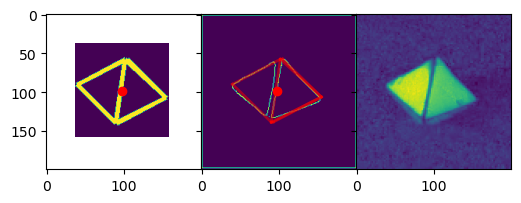

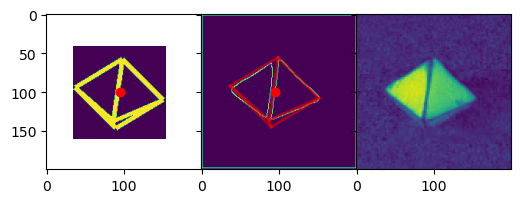

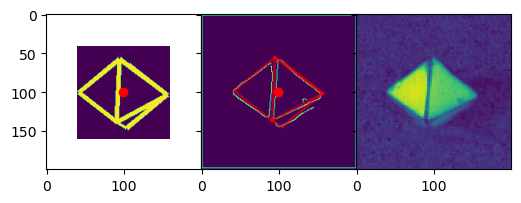

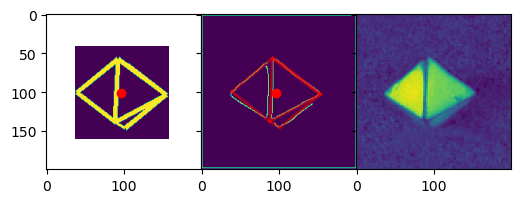

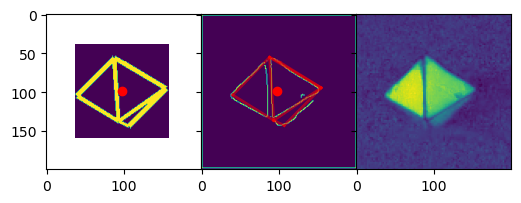

In [179]:
r_cen_list,c_cen_list,f0_list,frame_rot_list=do_sequence(frames_1c,start_rot,rstart,cstart,\
                dw,canny_sigma,canny_low,canny_high,\
                f0,df,nf,tem_scale_fac,angle,nl,model_vertices,model_faces)

In [181]:
# continue sequence 
#r_cen_list2,c_cen_list2,f0_list2,frame_rot_list2=do_sequence(frames_1c,frame_rot_list[-1],\
#                r_cen_list[-1],c_cen_list[-1],\
#                dw,canny_sigma,canny_low,canny_high,\
#                int(f0_list[-1]+df),df,40,tem_scale_fac,angle,nl,octa_vertices,octa_faces)

In [165]:
# stitch together 
#r_cen_list = np.append(r_cen_list,r_cen_list2)
#c_cen_list = np.append(c_cen_list,c_cen_list2)
#f0_list = np.append(f0_list,f0_list2)
#frame_rot_list = frame_rot_list + frame_rot_list2

In [189]:
f0_list

array([ 20,  22,  24,  26,  28,  30,  32,  34,  36,  38,  40,  42,  44,
        46,  48,  50,  52,  54,  56,  58,  60,  62,  64,  66,  68,  70,
        72,  74,  76,  78,  80,  82,  84,  86,  88,  90,  92,  94,  96,
        98, 100, 102, 104, 106, 108, 110, 112, 114, 116, 118, 120, 122,
       124, 126, 128, 130, 132, 134, 136, 138, 140, 142, 144, 146, 148,
       150, 152, 154, 156, 158, 160, 162, 164, 166, 168, 170, 172, 174,
       176, 178, 180, 182, 184, 186, 188, 190, 192, 194, 196, 198, 200,
       202, 204, 206, 208, 210, 212, 214, 216, 218, 220, 222, 224, 226,
       228, 230, 232, 234, 236, 238, 240, 242, 244, 246, 248, 250, 252,
       254, 256, 258, 260, 262, 264, 266, 268, 270, 272, 274, 276, 278,
       280, 282, 284, 286, 288, 290, 292, 294, 296, 298, 300, 302, 304,
       306, 308, 310, 312, 314, 316, 318, 320, 322, 324, 326, 328, 330,
       332, 334, 336, 338, 340, 342, 344, 346, 348, 350, 352, 354, 356,
       358, 360, 362, 364, 366, 368, 370, 372, 374, 376, 378, 38

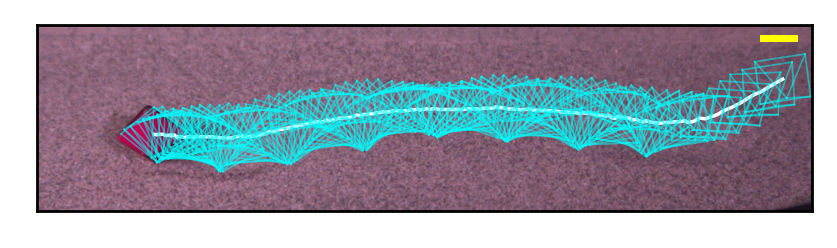

In [198]:
frame = framesrgb[398]  # which frame to put in background
ddf = 2;   # spacing between edge plots
bbox = [30,330,0,1250]  # bounding box in pixels
ofile = oroot + 'seq.png'
plt_sequence(r_cen_list,c_cen_list,f0_list,frame_rot_list,tem_scale_fac,\
             frame,ddf,model_vertices,model_faces,bbox,pixscale,'cyan',0.5,ofile)


# compute the spin vectors 
omega_arr = compute_spin_vec(frame_rot_list,f0_list,fps)

In [200]:
# plot trajectory and stuff 
# t0 is time from 0 in ms of impact, needs to be adjusted
# z0 is offset of z in mm, adjust this
# x0 is offset of x in mm, adjust this
def plt_traj(c_cen_list,r_cen_list,f0_list,omega_arr,pixscale,fps,\
             theta_cam,t0,z0,x0,ofile):
    tarr = (f0_list - t0)/fps *1e3 # in ms
    dt = (f0_list[1] - f0_list[0])/fps # in s
    omega_b = np.sqrt( omega_arr[:,0]**2 + omega_arr[:,1]**2 + omega_arr[:,2]**2)
    #  correct z for viewing angle with corr_fac at 45 degrees 
    corr_fac = np.cos(theta_cam)
    zarr = (-c_cen_list*pixscale+z0 ) /corr_fac  # in mm 
    xarr = r_cen_list*pixscale-x0  # x to mm 
    vxarr = savgol_filter(xarr,5,polyorder=1,deriv=1)/dt/1e3 # m/s
    vzarr = savgol_filter(zarr,5,polyorder=1,deriv=1)/dt/1e3 # m/s

    fig,axarr = plt.subplots(5,1,figsize=(4,6),sharex=True,sharey=False,dpi=150,facecolor='white')
    plt.subplots_adjust(hspace=0,wspace=0,left=0.2,right=0.98,top=0.98,bottom=0.15)
    axarr[0].plot(tarr,xarr)
    axarr[0].set_ylabel('x (mm)')
    axarr[1].plot(tarr,zarr)
    axarr[1].set_ylabel('z (mm)')  
    axarr[2].plot(tarr,vxarr)
    axarr[2].set_ylabel(r'$v_x$ (m/s)') 
    axarr[3].plot(tarr,vzarr)
    axarr[3].set_ylabel(r'$v_z$ (m/s)') 
    axarr[4].plot(tarr,omega_b,'.')
    axarr[4].set_ylabel('spin (1/s)')
    for k in range(5):
        yl,yh= axarr[k].get_ylim()
        axarr[k].plot([0,0],[yl,yh],':',color='grey',lw=1)
    xl,xh = axarr[0].get_xlim()
    axarr[0].plot([xl,xh],[0,0] ,':',color='grey',lw=1)
    axarr[1].plot([xl,xh],[0,0] ,':',color='grey',lw=1)
    #axarr[2].plot([-6,38],[0,0] ,':',color='grey',lw=1)
    axarr[3].plot([xl,xh],[0,0] ,':',color='grey',lw=1)
    #axarr[4].plot([xl,xh],[0,0] ,':',color='grey',lw=1)
    if (len(ofile) >3):
        fig.savefig(ofile,dpi=300)

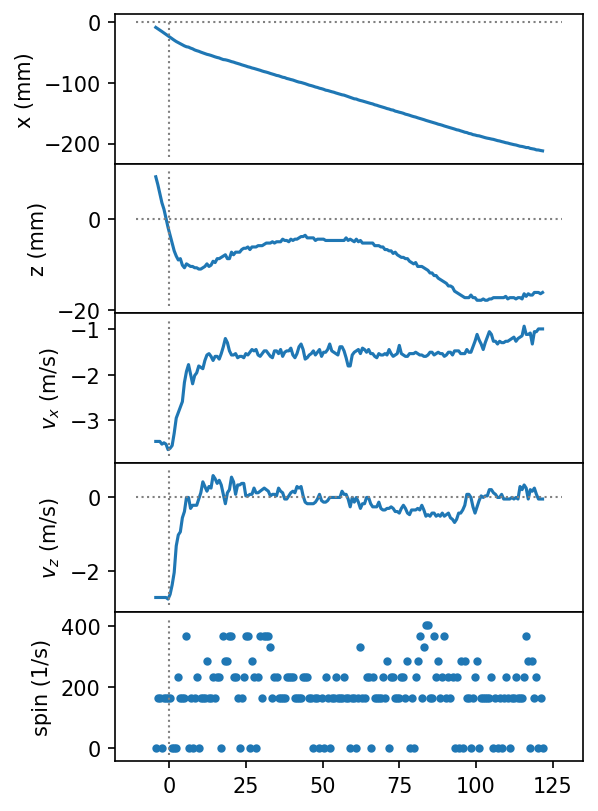

In [202]:
t0=33.0; x0=250; z0=30
ofile = ""
plt_traj(c_cen_list,r_cen_list,f0_list,omega_arr,pixscale,fps,\
             theta_cam,t0,z0,x0,ofile)